# MuJoCo manipulation tutorial, on this repo's Panda

Follows [HaoxiangYou/MujocoTutorials `robot_arms.ipynb`](https://github.com/HaoxiangYou/MujocoTutorials/blob/main/robot_arms.ipynb)
(itself based on [kevinzakka/mjctrl](https://github.com/kevinzakka/mjctrl)), step for step:

1. load the arm, 2. define a circular target, 3. simulate with no control,
4. differential IK, 5. differential IK with a null-space preference,
6. operational space control (torque).


In [2]:
import sys

sys.path.insert(0, "..")

# Pick up edits to panda/*.py without restarting the kernel.
%load_ext autoreload
%autoreload 2

import imageio_ffmpeg
import mediapy as media
import mujoco
import numpy as np

from panda.model import load_model

# media.show_video shells out to whatever `ffmpeg` is on PATH. Point it at the
# self-contained binary imageio-ffmpeg already ships (it is a dependency of this
# repo) so a half-installed system ffmpeg cannot break the videos below.
media.set_ffmpeg(imageio_ffmpeg.get_ffmpeg_exe())

## Load the model

`panda_nohand.xml` has no target to track, so we splice a mocap body in. `contype=0
conaffinity=0` keeps it out of the collision system — the marker is visual only, and the
measured constants in `panda/model.py` stay valid.

Its `pos`/`quat` are the tip pose at the `home` keyframe (0.554, 0, 0.625) and that site's
orientation, so every controller below starts with ~zero error instead of snapping.

""

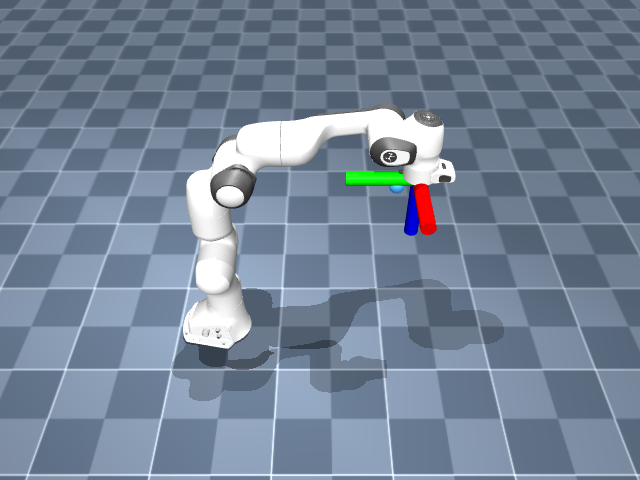

In [3]:
TARGET_XML = """
  <worldbody>
    <body name="target" pos="0.5 0 0.6" quat="0 -0.7071068 0.7071068 0" mocap="true">
      <geom type="sphere" size="0.02" rgba="0.2 0.6 1 0.6"
            contype="0" conaffinity="0"/>
    </body>
  </worldbody>
"""

model, data = load_model(scene=True, extra_xml=TARGET_XML)
mujoco.mj_resetDataKeyframe(model, data, 0)

renderer = mujoco.Renderer(model, height=480, width=640)
scene_option = mujoco.MjvOption()
scene_option.frame = mujoco.mjtFrame.mjFRAME_SITE
# Make all sitegroups visible.
scene_option.sitegroup[4] = 1

# The mocap target we drive, and the end-effector site we control.
mocap_id = model.body("target").mocapid[0]
site_id = model.site("attachment_site").id

# Stand-in for upstream's wrist-mounted `end_effector_camera`: a tracking camera
# locked onto the flange body. Same purpose (watch the tip), no XML surgery.
ee_cam = mujoco.MjvCamera()
ee_cam.type = mujoco.mjtCamera.mjCAMERA_TRACKING
ee_cam.trackbodyid = model.body("attachment").id
ee_cam.distance, ee_cam.azimuth, ee_cam.elevation = 0.9, 135.0, -25.0

mujoco.mj_forward(model, data)
renderer.update_scene(data, scene_option=scene_option)
media.show_image(renderer.render())

## Define the target trajectory

In [4]:
# Circle radius
r = 0.15
# Circle center x coordinate
cx = 0.5
# Circle center y coordinate
cy = 0.0
# Trajectory frequency
f = 0.5


def circle(t: float, r: float, h: float, k: float, f: float) -> np.ndarray:
    """Return the (x, y) coordinates of a circle with radius r centered at (h, k)
    as a function of time t and frequency f."""
    x = r * np.cos(2 * np.pi * f * t) + h
    y = r * np.sin(2 * np.pi * f * t) + k
    return np.array([x, y])

## Visualization helper

Capsules injected straight into the `mjvScene` (not model bodies), so the traces cost
nothing physically. Note `mjv_connector` — upstream calls `mjv_makeConnector`, which
MuJoCo renamed in 3.2 and which takes six scalars instead of two points.

In [5]:
def add_visual_capsule(scene, point1, point2, radius, rgba):
    """Adds one capsule to an mjvScene."""
    if scene.ngeom >= scene.maxgeom:
        return
    scene.ngeom += 1  # increment ngeom
    # initialise a new capsule, then place it with mjv_connector
    mujoco.mjv_initGeom(scene.geoms[scene.ngeom - 1],
                        mujoco.mjtGeom.mjGEOM_CAPSULE, np.zeros(3),
                        np.zeros(3), np.zeros(9), rgba.astype(np.float32))
    mujoco.mjv_connector(scene.geoms[scene.ngeom - 1],
                         mujoco.mjtGeom.mjGEOM_CAPSULE, radius,
                         point1, point2)


def modify_scene(scn, target_traj, end_effector_traj):
    """Draw position traces: blue = target, red = end-effector."""
    for i in range(len(target_traj) - 1):
        add_visual_capsule(scn, target_traj[i], target_traj[i + 1], 0.005,
                           np.array([0, 0, 1.0, 1.0]))
        add_visual_capsule(scn, end_effector_traj[i], end_effector_traj[i + 1], 0.005,
                           np.array([1.0, 0, 0, 0.8]))

## Simulate without control

Nothing writes `data.ctrl`, so the position servos hold the `home` keyframe's `ctrl` and
the arm just sits there while the blue target circles away from it.

In [6]:
duration = 5  # (seconds)
framerate = 30  # (Hz)

frames = []
end_effector_traj = []
target_traj = []

mujoco.mj_resetDataKeyframe(model, data, 0)

while data.time < duration:
    # Set the target position accordingly.
    data.mocap_pos[mocap_id, 0:2] = circle(data.time, r, cx, cy, f)
    mujoco.mj_step(model, data)

    target_traj.append(data.mocap_pos[mocap_id].copy())
    end_effector_traj.append(data.site(site_id).xpos.copy())

    if len(frames) < data.time * framerate:
        renderer.update_scene(data, camera=ee_cam, scene_option=scene_option)
        modify_scene(renderer.scene, target_traj[::10], end_effector_traj[::10])
        frames.append(renderer.render())

media.show_video(frames, fps=framerate)

## The 6-D pose error and its Jacobian

Every controller below needs the same two quantities, so they live in one function
instead of being pasted three times. The buffers are preallocated and reused: `error_pos`
and `error_ori` are *views* into `error`, so writing them writes `error`.

In [7]:
# Pre-allocated buffers. nv == 7 for both models used in this notebook.
jac = np.zeros((6, model.nv))
error = np.zeros(6)
error_pos = error[:3]  # view into error[:3]
error_ori = error[3:]  # view into error[3:]
site_quat = np.zeros(4)
target_quat_conj = np.zeros(4)
error_quat = np.zeros(4)


def pose_error(model, data):
    """Fill `error` (6,) and `jac` (6, nv) for the tracked site. Returns nothing."""
    # Position error, world frame.
    error_pos[:] = data.site(site_id).xpos - data.mocap_pos[mocap_id]

    # Orientation error. target_ori x error_ori = ee_ori, so
    # error_ori = ee_ori x inverse(target_ori). Most of MuJoCo's orientation
    # helpers are quaternion-based; scipy / jaxlie are the alternatives.
    mujoco.mju_negQuat(target_quat_conj, data.mocap_quat[mocap_id])
    mujoco.mju_mat2Quat(site_quat, data.site(site_id).xmat)
    mujoco.mju_mulQuat(error_quat, site_quat, target_quat_conj)
    # To axis-angle, because that is how mj_jacSite represents rotation.
    mujoco.mju_quat2Vel(error_ori, error_quat, 1.0)

    # Jacobian of the site's world pose w.r.t. the joints.
    mujoco.mj_jacSite(model, data, jac[:3], jac[3:], site_id)

## Differential IK

Take a step `dq` such that `J dq = -error`, and hand the resulting configuration to the
position servos. `pinv` picks the minimum-norm `dq` of the infinitely many that satisfy
it — the arm has 7 joints for a 6-D task, so there is a 1-D family to choose from.

In [8]:
duration = 8  # (seconds)
framerate = 30  # (Hz)

frames = []
ee_view_frames = []
end_effector_traj = []
target_traj = []
pos_errors = []

mujoco.mj_resetDataKeyframe(model, data, 0)

while data.time < duration:
    data.mocap_pos[mocap_id, 0:2] = circle(data.time, r, cx, cy, f)
    pose_error(model, data)

    # Minimum-norm solution of J dq = -error. (The textbook form solves
    # J v = -speed * error / dt for a velocity; this steps in position directly.)
    dq = np.linalg.pinv(jac) @ -error

    # The actuators are PD position servos, so command the joint target directly.
    q = data.qpos.copy()
    # Same as q += dq here, but correct if q ever contains a quaternion.
    mujoco.mj_integratePos(model, q, dq, 1)
    np.clip(q, *model.jnt_range.T, out=q)
    data.ctrl = q

    mujoco.mj_step(model, data)

    target_traj.append(data.mocap_pos[mocap_id].copy())
    end_effector_traj.append(data.site(site_id).xpos.copy())
    if data.time > 1.0:
        pos_errors.append(np.linalg.norm(error_pos))

    if len(frames) < data.time * framerate:
        renderer.update_scene(data, scene_option=scene_option)
        modify_scene(renderer.scene, target_traj[::10], end_effector_traj[::10])
        frames.append(renderer.render())

        renderer.update_scene(data, camera=ee_cam, scene_option=scene_option)
        modify_scene(renderer.scene, target_traj[::10], end_effector_traj[::10])
        ee_view_frames.append(renderer.render())

# A steady lag, not a bug: proportional-only tracking of a target moving at
# 2*pi*f*r = 0.47 m/s. Raise f or r and it grows.
print(f"mean tracking error after 1 s: {np.mean(pos_errors):.4f} m")
media.show_video(frames, fps=framerate)
media.show_video(ee_view_frames, fps=framerate)

mean tracking error after 1 s: 0.0455 m


## Differential IK with a configuration (null-space) preference

7 joints, 6-D task — many configurations trace the same circle. Instead of `pinv`'s
minimum-norm `dq`, ask for the `dq` that keeps the arm near its home configuration:

$$\min_{dq} \; \|K_n (q + dq - q_0)\|_2^2 \quad \text{s.t.} \quad J\,dq = -\text{error}$$

which the KKT conditions solve in closed form. `Kn` weights how much each joint cares
about matching `q0`; the trailing zeros leave the wrist free.

In [9]:
# Stay as close to the initial configuration as the task allows.
q0 = model.key(0).qpos

# How much each joint cares about matching q0. Wrist joints: don't care.
Kn = np.diag(np.array([1.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0]))

duration = 8
framerate = 30

frames = []
ee_view_frames = []
end_effector_traj = []
target_traj = []
pos_errors = []
drift = []

mujoco.mj_resetDataKeyframe(model, data, 0)

while data.time < duration:
    data.mocap_pos[mocap_id, 0:2] = circle(data.time, r, cx, cy, f)
    pose_error(model, data)

    q = data.qpos.copy()
    # KKT system for  min ||Kn (q + dq - q0)||^2  s.t.  J dq = -error.
    H = 2 * Kn.T @ Kn
    KKT_matrix = np.concatenate([
        np.concatenate([H, jac.T], axis=1),
        np.concatenate([jac, np.zeros((jac.shape[0], jac.shape[0]))], axis=1),
    ], axis=0)
    dq = (np.linalg.pinv(KKT_matrix) @ np.concatenate([H @ (q0 - q), -error]))[:q.shape[0]]

    mujoco.mj_integratePos(model, q, dq, 1)
    np.clip(q, *model.jnt_range.T, out=q)
    data.ctrl = q

    mujoco.mj_step(model, data)

    target_traj.append(data.mocap_pos[mocap_id].copy())
    end_effector_traj.append(data.site(site_id).xpos.copy())
    if data.time > 1.0:
        pos_errors.append(np.linalg.norm(error_pos))
        drift.append(np.linalg.norm((data.qpos - q0)[:4]))

    if len(frames) < data.time * framerate:
        renderer.update_scene(data, scene_option=scene_option)
        modify_scene(renderer.scene, target_traj[::10], end_effector_traj[::10])
        frames.append(renderer.render())

        renderer.update_scene(data, camera=ee_cam, scene_option=scene_option)
        modify_scene(renderer.scene, target_traj[::10], end_effector_traj[::10])
        ee_view_frames.append(renderer.render())

# Tracking is unchanged (the constraint is the same); the drift on the weighted
# joints roughly halves versus plain pinv, which measured 0.99 rad here.
print(f"mean tracking error: {np.mean(pos_errors):.4f} m")
print(f"mean |q - q0| over joints 1-4: {np.mean(drift):.3f} rad")
media.show_video(frames, fps=framerate)
media.show_video(ee_view_frames, fps=framerate)

mean tracking error: 0.0458 m
mean |q - q0| over joints 1-4: 0.503 rad


## Operational space control (torque!)

Everything so far was kinematics: solve for a joint position, let a PD servo chase it.
Now command torque directly.

Given a target pose $x_\text{target}$, ask the end-effector for
$\ddot{x}_\text{des} = -K_p(x - x_\text{target}) - K_v \dot{x}$. Dropping the
$\dot{J}\dot{q}$ terms, the torque that produces it is

$$\tau = J^T M_x \ddot{x}_\text{des} + \text{bias},\qquad M_x = (J M^{-1} J^T)^{-1}$$

where bias is gravity plus Coriolis (`data.qfrc_bias`).

Upstream swaps in a Kuka iiwa whose scene has `motor` (torque) actuators. Menagerie's
stock iiwa is position-controlled too, so instead: keep the Panda, zero out its servo
gains, and write torque to `data.qfrc_applied` — which `mj_step` adds straight into the
generalized force. Fresh model object, so the cells above still work if you re-run them.

In [10]:
model_t, data_t = load_model(scene=True, extra_xml=TARGET_XML)

# Kill the position servos: force = gainprm[0]*ctrl + biasprm[1]*q + biasprm[2]*qdot.
# Zero all three and the actuators produce nothing, leaving qfrc_applied in charge.
model_t.actuator_gainprm[:, 0] = 0.0
model_t.actuator_biasprm[:, 1:3] = 0.0
# The Panda's real torque limits, already in the model as the actuator force range.
tau_lo, tau_hi = model_t.actuator_forcerange.T

renderer_t = mujoco.Renderer(model_t, height=480, width=640)

M_inv = np.zeros((model_t.nv, model_t.nv))

# Cartesian impedance gains.
impedance_pos = np.asarray([100.0, 100.0, 100.0])  # [N/m]
impedance_ori = np.asarray([50.0, 50.0, 50.0])  # [Nm/rad]
Kp = np.concatenate([impedance_pos, impedance_ori], axis=0)
# Kd from a damping ratio.
damping_ratio = 1.0
Kd = damping_ratio * 2 * np.sqrt(Kp)

# Null-space preference, same idea as the cell above but as a torque.
Kp_null = np.asarray([75.0, 75.0, 50.0, 50.0, 40.0, 25.0, 25.0])
Kd_null = damping_ratio * 2 * np.sqrt(Kp_null)

duration = 8
framerate = 30
frames = []
target_traj = []
end_effector_traj = []
pos_errors = []

mujoco.mj_resetDataKeyframe(model_t, data_t, 0)

while data_t.time < duration:
    data_t.mocap_pos[mocap_id, 0:2] = circle(data_t.time, r, cx, cy, f)
    pose_error(model_t, data_t)

    # Task-space inertia. mj_solveM solves M X = Y; with Y = I that is M^{-1}.
    mujoco.mj_solveM(model_t, data_t, M_inv, np.eye(model_t.nv))
    Mx = np.linalg.pinv(jac @ M_inv @ jac.T)

    tau = jac.T @ Mx @ (-Kp * error - Kd * (jac @ data_t.qvel)) + data_t.qfrc_bias

    # Project the null-space term so it cannot disturb the task.
    Jbar = M_inv @ jac.T @ Mx
    ddq = -Kp_null * (data_t.qpos - q0) - Kd_null * data_t.qvel
    tau += (np.eye(model_t.nv) - jac.T @ Jbar.T) @ ddq

    data_t.qfrc_applied[:] = np.clip(tau, tau_lo, tau_hi)
    mujoco.mj_step(model_t, data_t)

    target_traj.append(data_t.mocap_pos[mocap_id].copy())
    end_effector_traj.append(data_t.site(site_id).xpos.copy())
    if data_t.time > 1.0:
        pos_errors.append(np.linalg.norm(error_pos))

    if len(frames) < data_t.time * framerate:
        renderer_t.update_scene(data_t, scene_option=scene_option)
        modify_scene(renderer_t.scene, target_traj[::10], end_effector_traj[::10])
        frames.append(renderer_t.render())

# Larger lag than differential IK: this is a finite-stiffness spring chasing a
# moving target, so raising impedance_pos tightens it (at the usual cost).
print(f"mean tracking error after 1 s: {np.mean(pos_errors):.4f} m")
media.show_video(frames, fps=framerate)

mean tracking error after 1 s: 0.0902 m
